# Table of Contents
1. Introduction
2. Import
3. Analysis & Preprocessing
4. Model
5. Training
6. Analysis & Conclusion

# 1. Introduction
 `Notes: PNG and TIFF images were removed from the dataset to only use JPEG images for consistency`

# 2. Import

On MacOS for M1 chip, I had many issues with Tensorflow. In my environment I had to ensure I had the following installed:

- python -m pip install tensorflow-macos
- python -m pip install tensorflow-metal

In [2]:
import numpy as np

In [3]:
import pandas as pd

In [4]:
import tensorflow as tf

In [5]:
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from keras import layers 
from keras import Model 
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPool2D , Flatten, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam

from tensorflow.keras import utils, callbacks
# checkpoint will stop the model based on a parameter in training 
# earlyStopping to stop training in accuracy stops increasing

In [42]:
import matplotlib.pyplot as plt
import os
from pylab import *
import shutil #for split into train, val, test
import random
import seaborn as sns #visualizing the data
import sklearn as sk
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, f1_score

# 3. Analysis & Preprocessing

The following cell should only be ran ONCE! 

In [23]:
class_dir = ['Healthy', 'Brain_Tumor'] #labels

# source 1: https://www.geeksforgeeks.org/python-shutil-copy-method/
# source 2: https://www.kaggle.com/questions-and-answers/102677

# directory for images (jpg)
root_dir = 'data/' # data root path

val_ratio = 0.15 # 15% of total images -> val  
test_ratio = 0.05 # 5% of total images -> test

for cls in class_dir:
    os.makedirs(root_dir +'train/' + cls)
    os.makedirs(root_dir +'val/' + cls)
    os.makedirs(root_dir +'test/' + cls)

    # Creating partitions of the data after shuffeling
    src = root_dir + cls # Folder to copy images from
    allFileNames = os.listdir(src)
    np.random.shuffle(allFileNames)
    train_FileNames, val_FileNames, test_FileNames = np.split(np.array(allFileNames),
                                                          [int(len(allFileNames)* (1 - (val_ratio + test_ratio))), 
                                                           int(len(allFileNames)* (1 - test_ratio))])

    train_FileNames = [src+'/'+ name for name in train_FileNames.tolist()]

    val_FileNames = [src+'/' + name for name in val_FileNames.tolist()]
    test_FileNames = [src+'/' + name for name in test_FileNames.tolist()]


    print("\n*****************************")
    print('Total images: ', len(allFileNames), cls)
    print('Training: ', len(train_FileNames), cls)
    print('Validation: ', len(val_FileNames), cls)
    print('Testing: ', len(test_FileNames), cls)
    print("*****************************")

    try:
        # Copy-pasting folders
        for name in train_FileNames:
            shutil.copy(name, root_dir +'train/' + cls)

        print("Train copied successfully.")

        for name in val_FileNames:
            shutil.copy(name, root_dir +'val/' + cls)

        print("Val copied successfully.")

        for name in test_FileNames:
            shutil.copy(name, root_dir +'test/' + cls)

        print("Test copied successfully.")

    # If source and destination are same
    except shutil.SameFileError:
        print("Source and destination represents the same file.")

    # if there is any permission issue
    except PermissionError:
        print("Permission denied.")

    # For other errors
    except:
        print("Error occurred while copying file.")
        
print("Successfully copied files")


*****************************
Total images:  2087 Healthy
Training:  1669 Healthy
Validation:  313 Healthy
Testing:  105 Healthy
*****************************
Train copied successfully.
Val copied successfully.
Test copied successfully.

*****************************
Total images:  2513 Brain_Tumor
Training:  2010 Brain_Tumor
Validation:  377 Brain_Tumor
Testing:  126 Brain_Tumor
*****************************
Train copied successfully.
Val copied successfully.
Test copied successfully.
Successfully copied files


In [62]:
b_size = 256 # batch size = 256

train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        'data/train/',
        target_size=(150, 150),
        batch_size= b_size,
        class_mode='binary')
validation_generator = test_datagen.flow_from_directory(
        'data/val/',
        target_size=(150, 150),
        batch_size= b_size,
        class_mode='binary')
test_generator = test_datagen.flow_from_directory(
        'data/test/',
        target_size=(150, 150),
        batch_size= b_size,
        class_mode='binary',
        shuffle=False)

Found 3679 images belonging to 2 classes.
Found 690 images belonging to 2 classes.
Found 231 images belonging to 2 classes.


In [63]:
#Expected: a batch of 256 images, image of size 224x224, 3 (rgb)
a, b = train_generator.next() 
print('Batch shape=%s, min=%.3f, max=%.3f' % (a.shape, a.min(), a.max()))
print('Num images = %s' % (b.shape))

Batch shape=(256, 150, 150, 3), min=0.000, max=1.000
Num images = 256


In [64]:
classes = train_generator.class_indices
classes

{'Brain_Tumor': 0, 'Healthy': 1}

<AxesSubplot:>

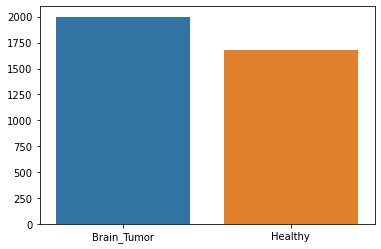

In [65]:
# Visualizing the train data in a bar chart
t=0
h=0
for i in range(15):
    a, b = next(train_generator)
    for j in b:
        if j == 1: # Brain Tumor
            h+=1
        else:t+=1

sns.barplot(x=['Brain_Tumor','Healthy'],y=[t,h])

Observations: Batch relatively balanced

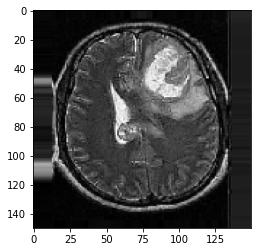

Brain Tumor


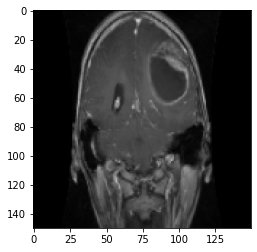

Brain Tumor


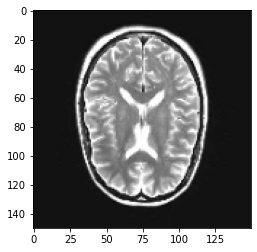

Healthy


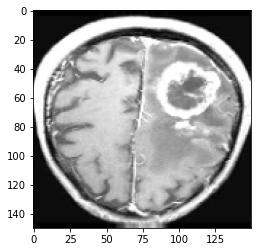

Brain Tumor


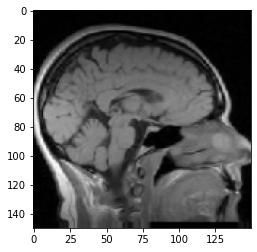

Healthy


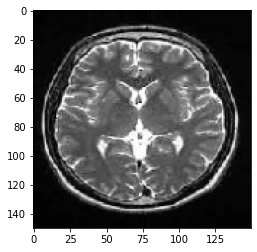

Healthy


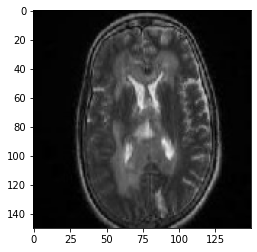

Healthy


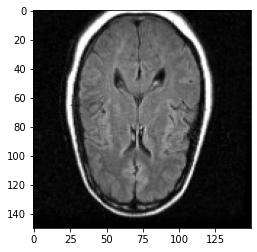

Healthy


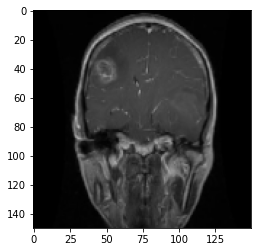

Brain Tumor


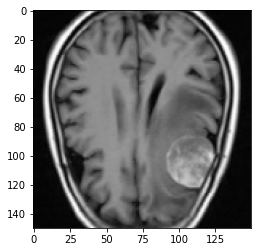

Brain Tumor


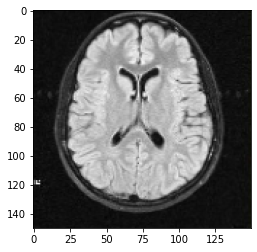

Healthy


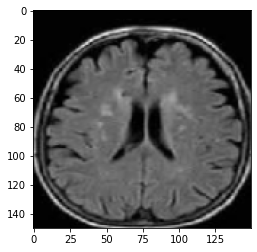

Healthy


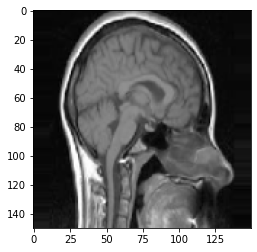

Healthy


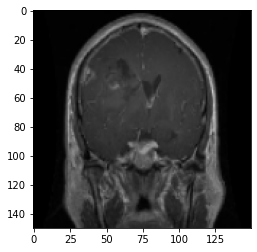

Brain Tumor


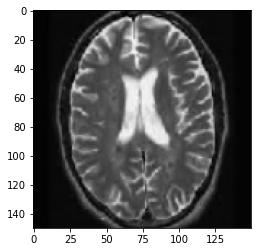

Healthy


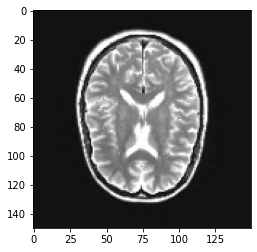

Healthy


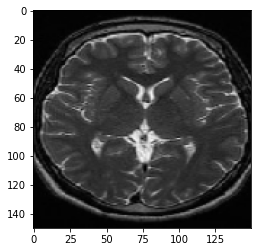

Healthy


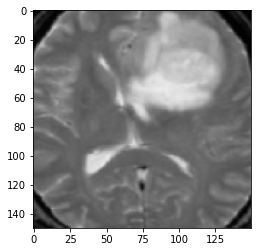

Brain Tumor


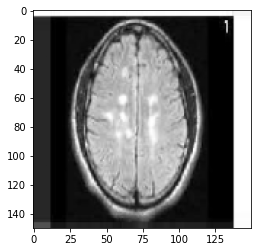

Healthy


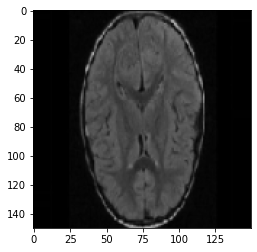

Healthy


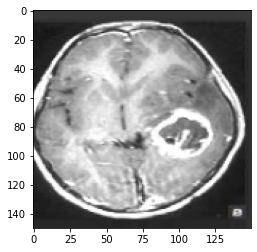

Brain Tumor


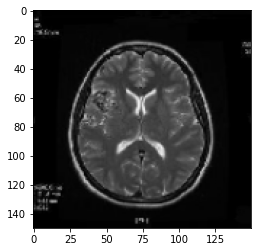

Healthy


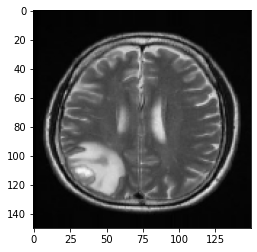

Brain Tumor


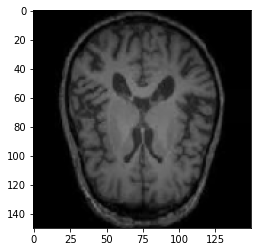

Healthy


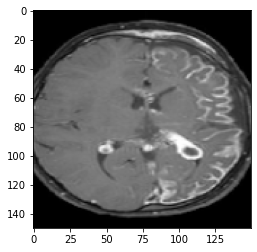

Brain Tumor


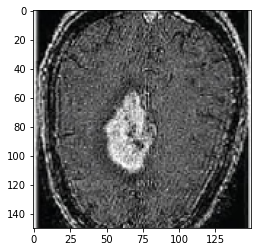

Brain Tumor


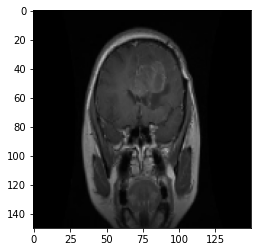

Brain Tumor


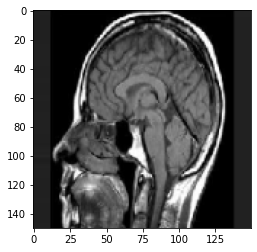

Healthy


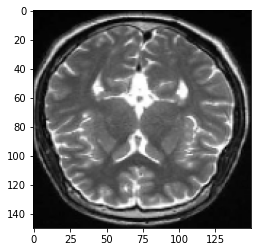

Healthy


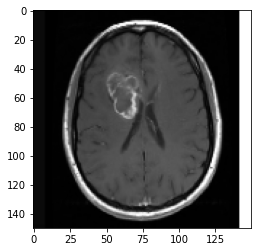

Brain Tumor


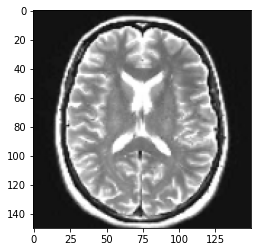

Healthy


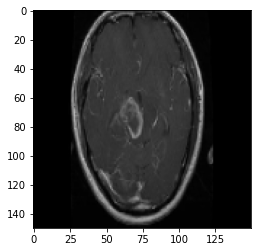

Brain Tumor


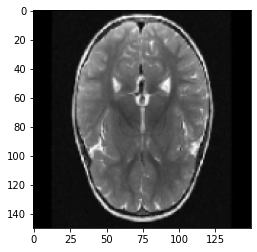

Healthy


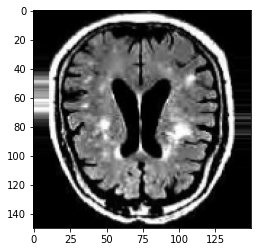

Healthy


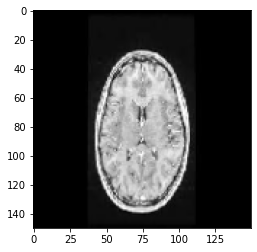

Healthy


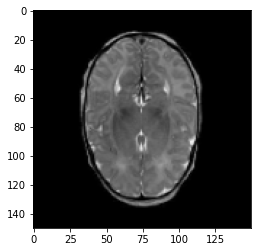

Healthy


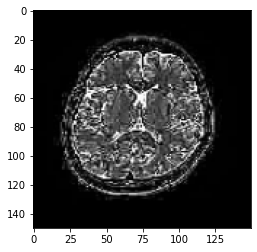

Healthy


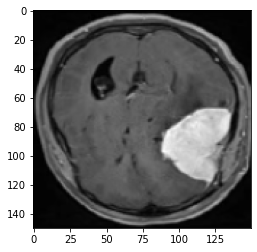

Brain Tumor


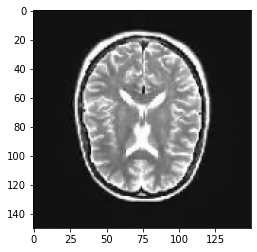

Healthy


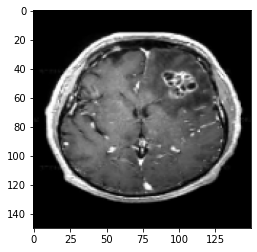

Brain Tumor


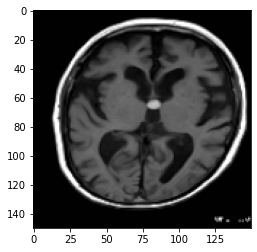

Brain Tumor


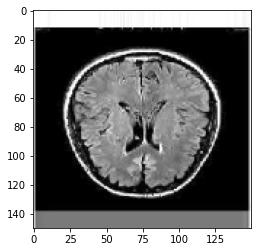

Healthy


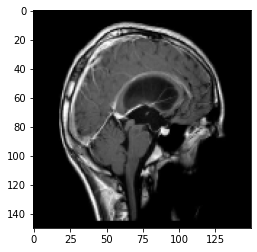

Brain Tumor


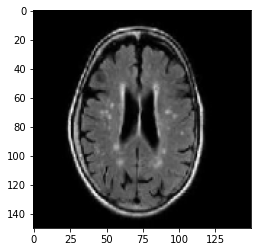

Healthy


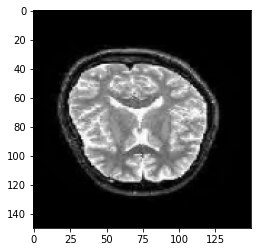

Healthy


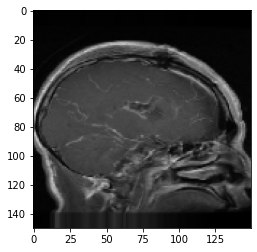

Brain Tumor


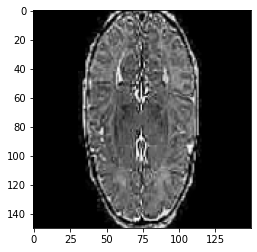

Healthy


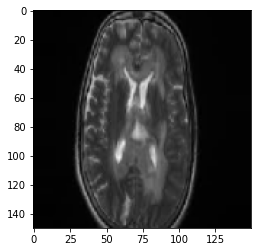

Healthy


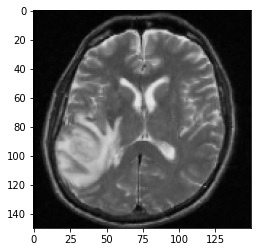

Brain Tumor


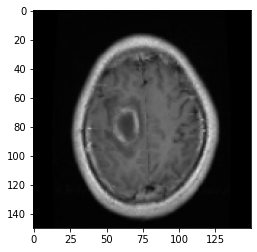

Brain Tumor


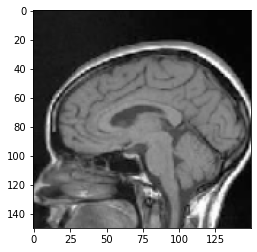

Healthy


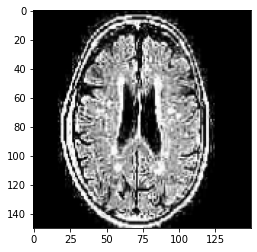

Healthy


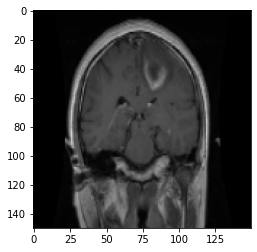

Brain Tumor


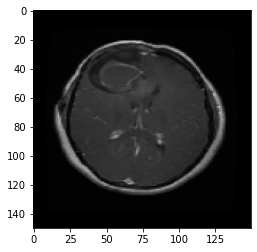

Brain Tumor


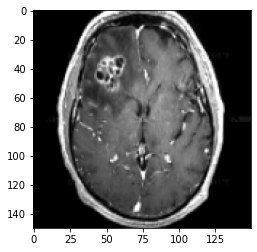

Brain Tumor


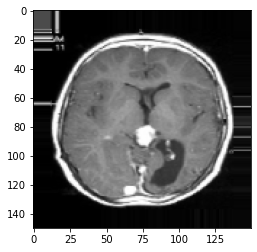

Brain Tumor


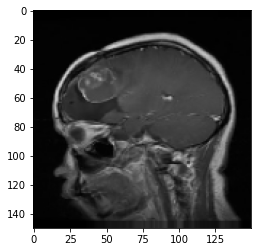

Brain Tumor


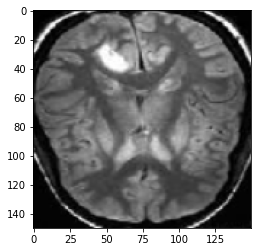

Brain Tumor


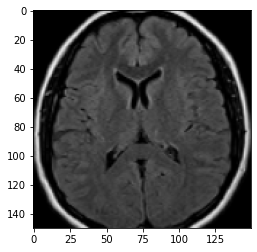

Healthy


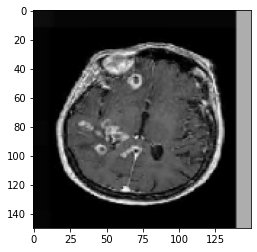

Brain Tumor


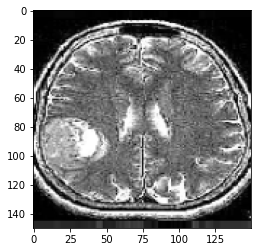

Brain Tumor


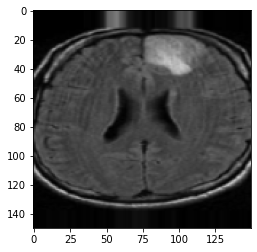

Brain Tumor


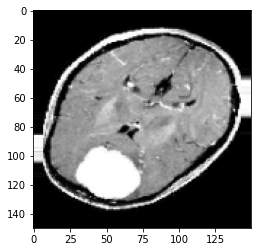

Brain Tumor


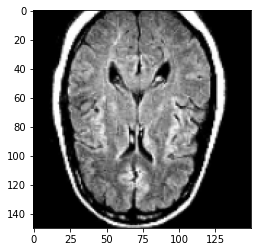

Healthy


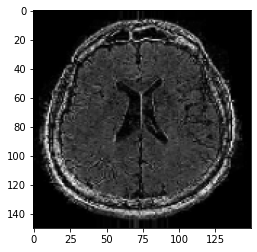

Healthy


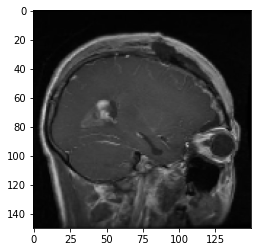

Brain Tumor


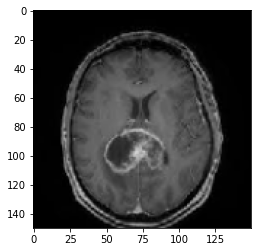

Brain Tumor


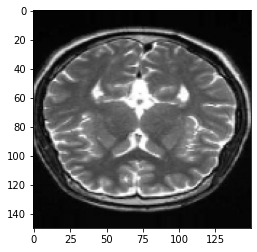

Healthy


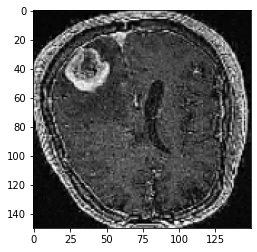

Brain Tumor


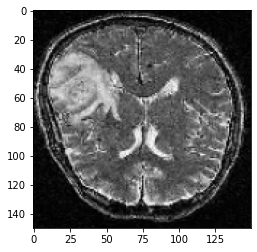

Brain Tumor


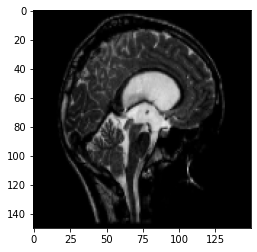

Brain Tumor


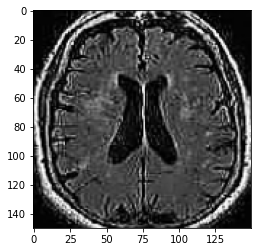

Healthy


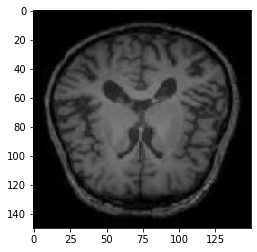

Healthy


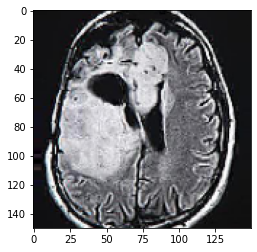

Brain Tumor


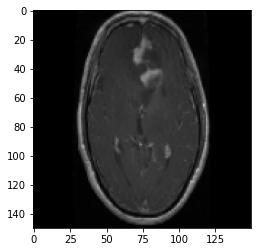

Brain Tumor


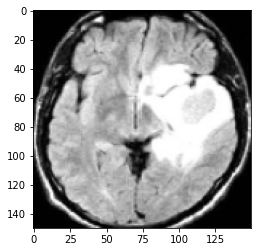

Brain Tumor


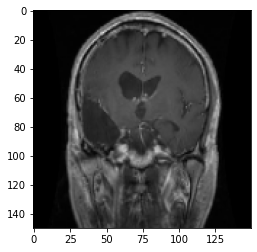

Brain Tumor


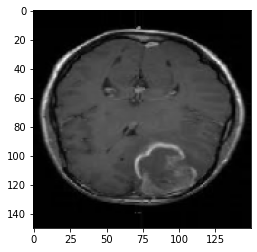

Brain Tumor


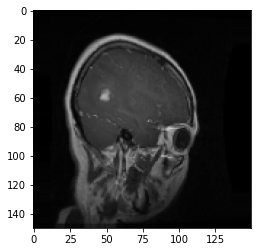

Brain Tumor


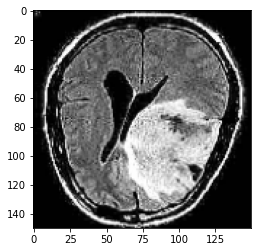

Brain Tumor


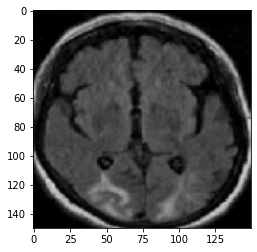

Healthy


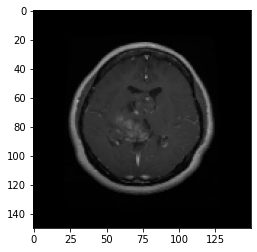

Brain Tumor


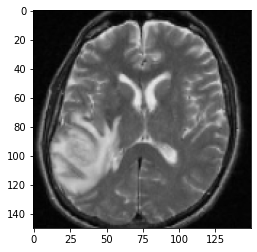

Brain Tumor


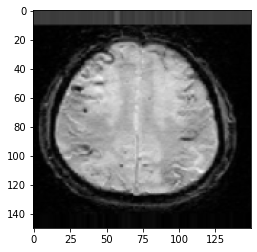

Healthy


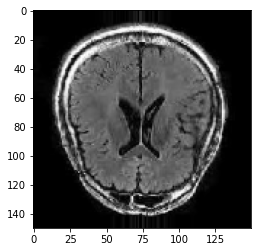

Healthy


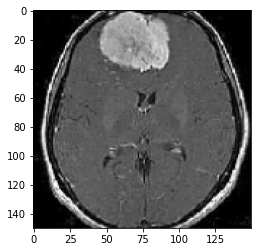

Brain Tumor


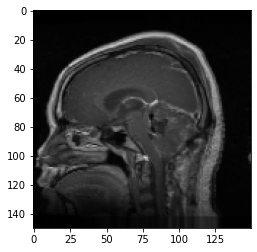

Brain Tumor


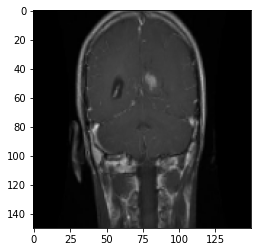

Brain Tumor


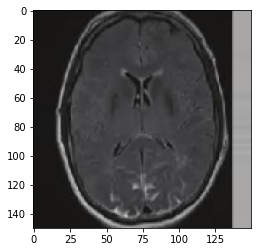

Healthy


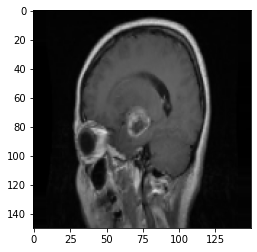

Brain Tumor


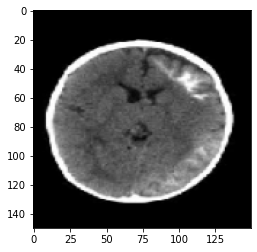

Healthy


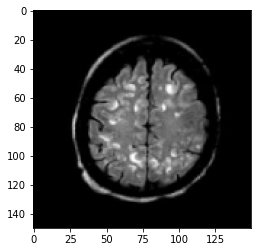

Healthy


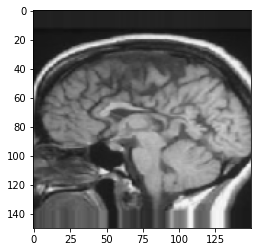

Healthy


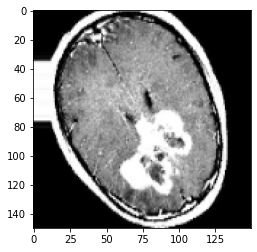

Brain Tumor


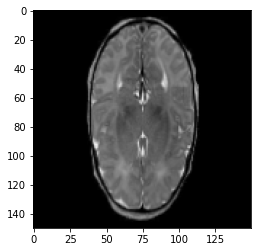

Healthy


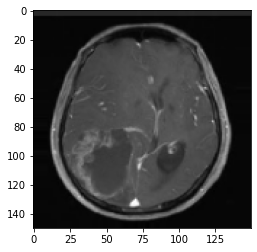

Brain Tumor


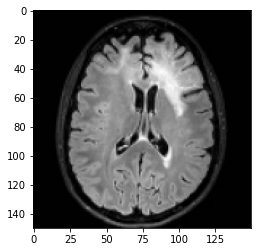

Healthy


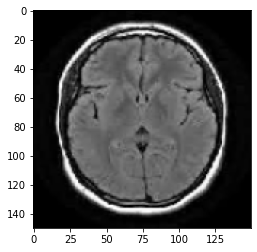

Healthy


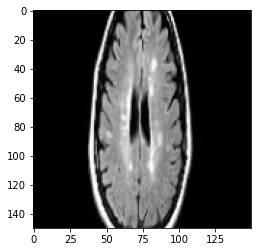

Healthy


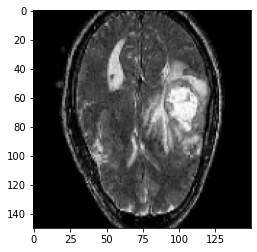

Brain Tumor


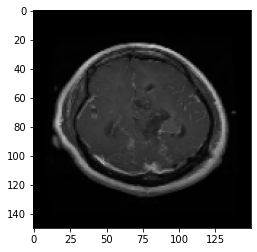

Brain Tumor


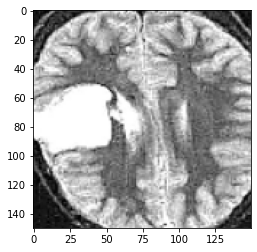

Brain Tumor


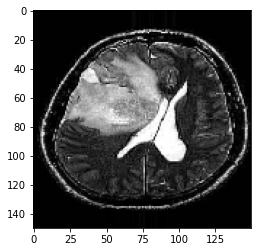

Brain Tumor


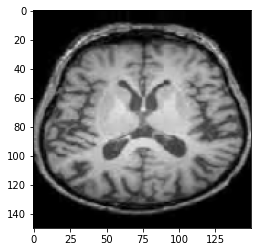

Healthy


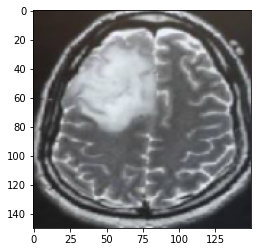

Brain Tumor


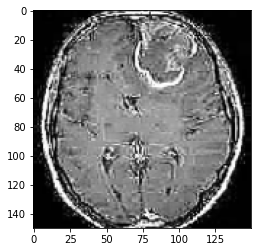

Brain Tumor


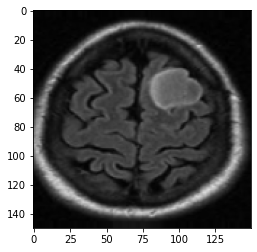

Brain Tumor


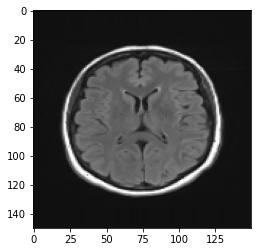

Healthy


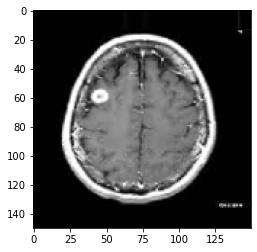

Brain Tumor


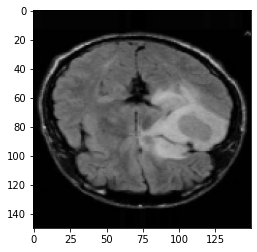

Brain Tumor


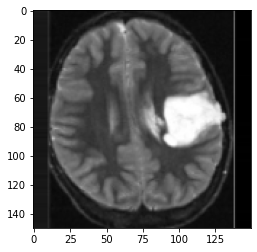

Brain Tumor


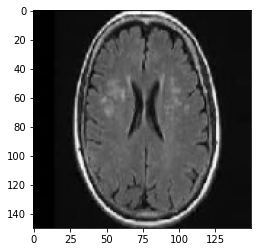

Healthy


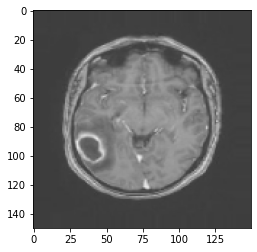

Brain Tumor


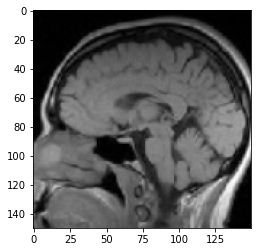

Healthy


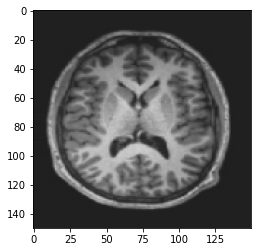

Healthy


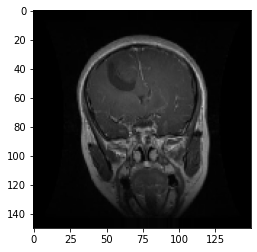

Brain Tumor


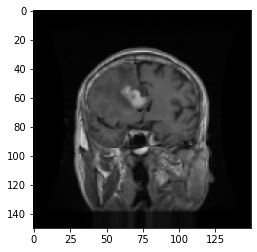

Brain Tumor


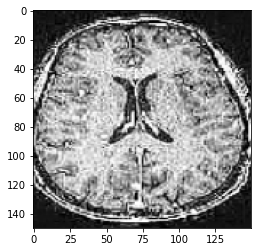

Healthy


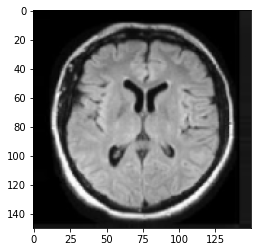

Healthy


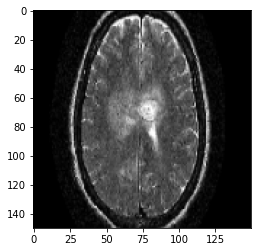

Brain Tumor


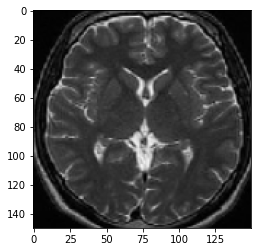

Healthy


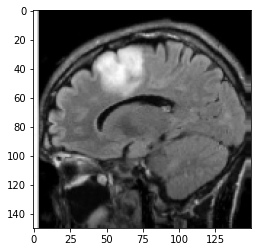

Brain Tumor


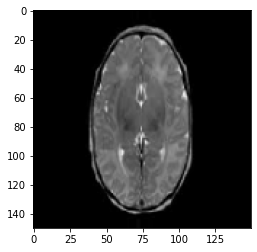

Healthy


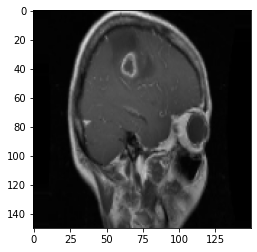

Brain Tumor


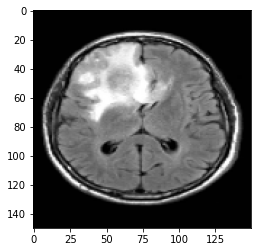

Brain Tumor


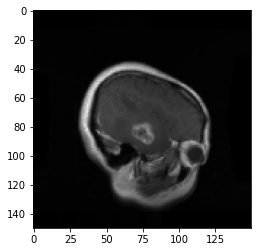

Brain Tumor


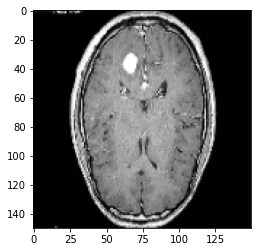

Brain Tumor


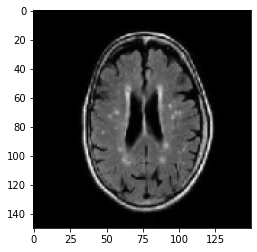

Healthy


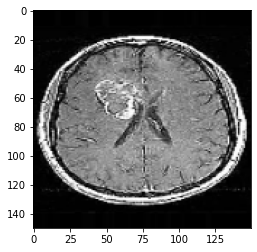

Brain Tumor


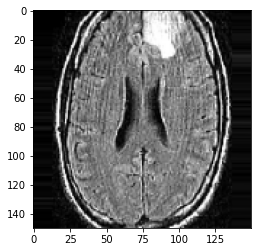

Brain Tumor


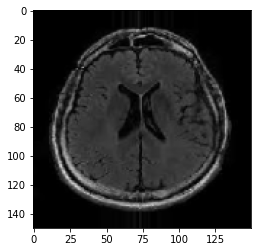

Healthy


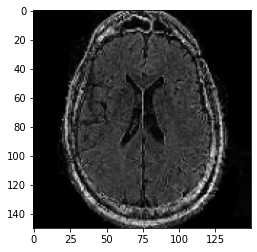

Healthy


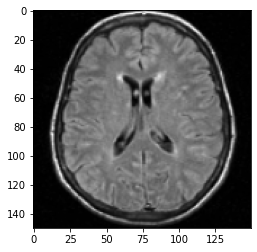

Healthy


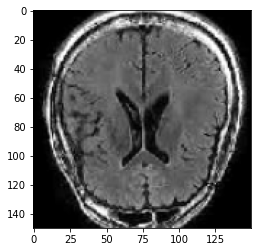

Healthy


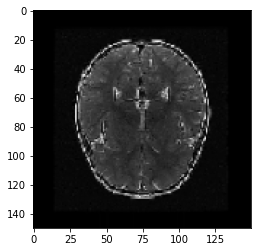

Healthy


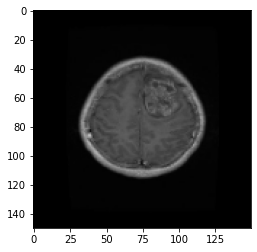

Brain Tumor


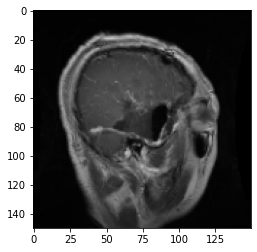

Brain Tumor


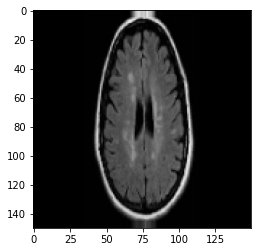

Healthy


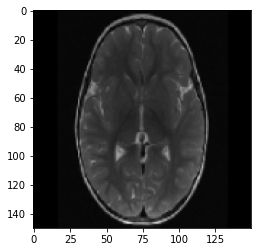

Healthy


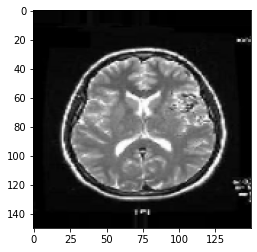

Healthy


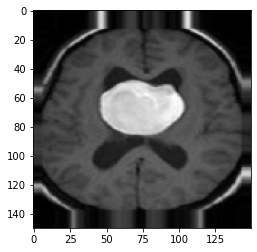

Brain Tumor


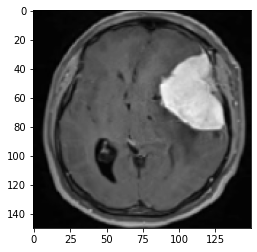

Brain Tumor


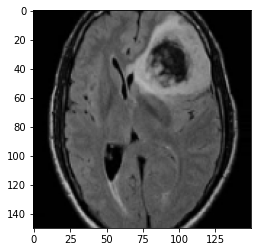

Brain Tumor


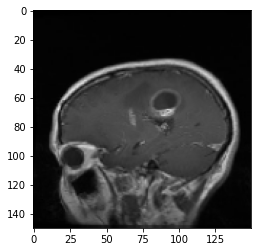

Brain Tumor


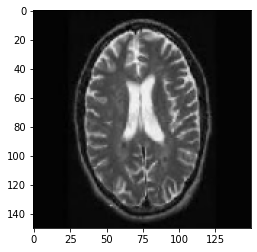

Healthy


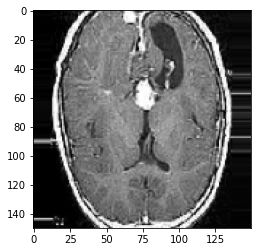

Brain Tumor


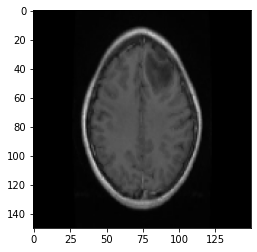

Brain Tumor


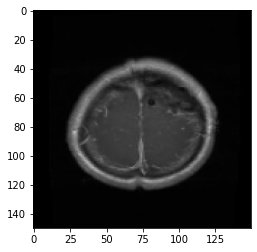

Brain Tumor


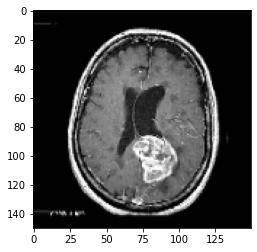

Brain Tumor


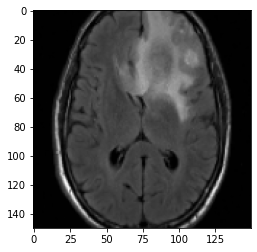

Brain Tumor


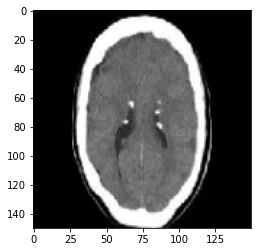

Healthy


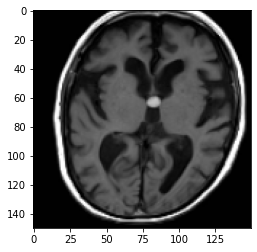

Brain Tumor


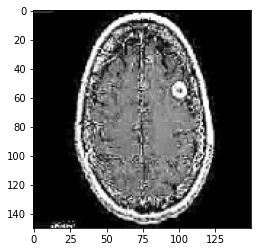

Brain Tumor


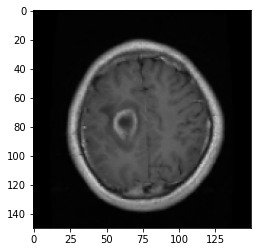

Brain Tumor


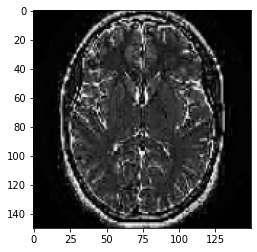

Healthy


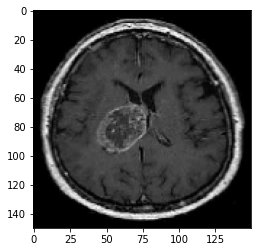

Brain Tumor


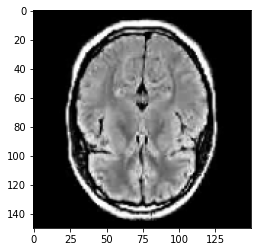

Healthy


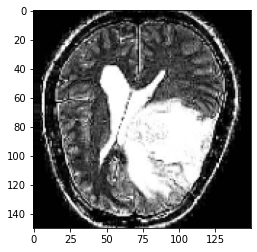

Brain Tumor


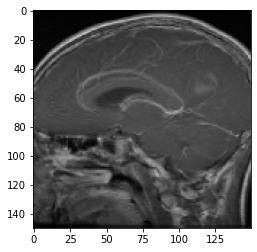

Brain Tumor


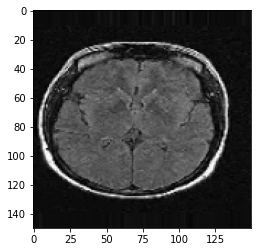

Healthy


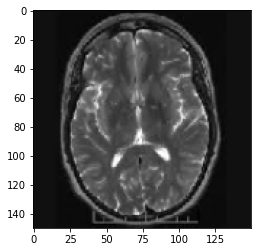

Healthy


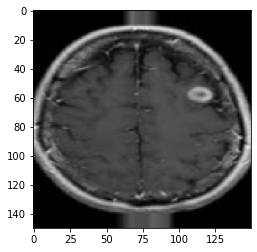

Brain Tumor


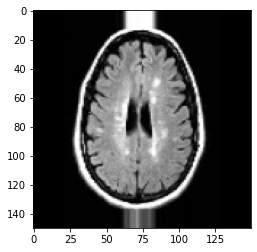

Healthy


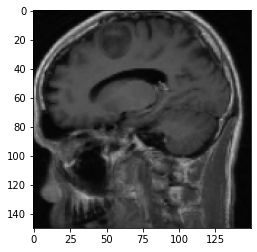

Brain Tumor


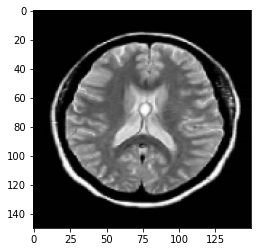

Brain Tumor


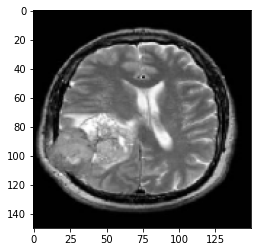

Brain Tumor


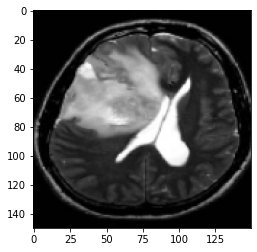

Brain Tumor


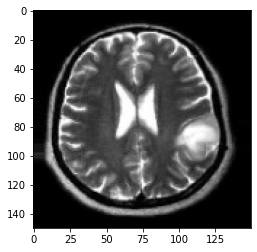

Healthy


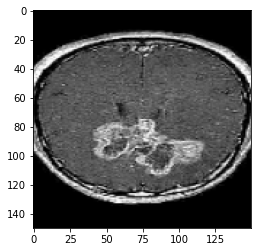

Brain Tumor


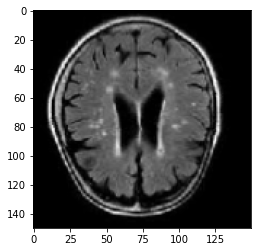

Healthy


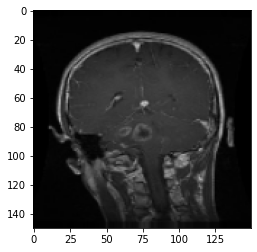

Brain Tumor


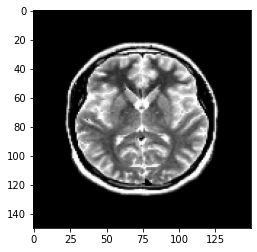

Healthy


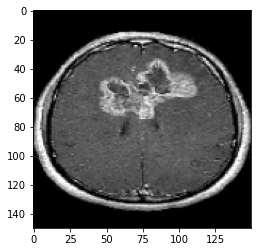

Brain Tumor


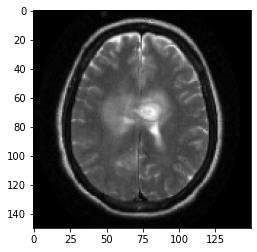

Brain Tumor


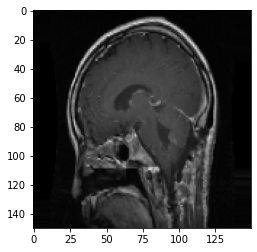

Brain Tumor


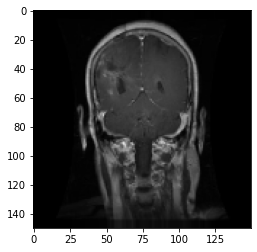

Brain Tumor


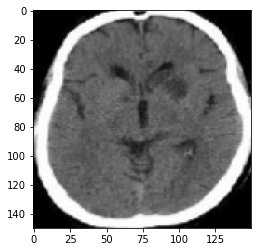

Healthy


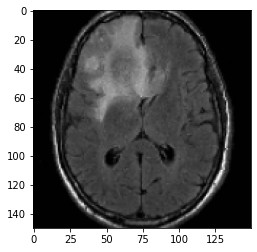

Brain Tumor


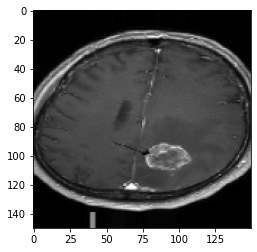

Brain Tumor


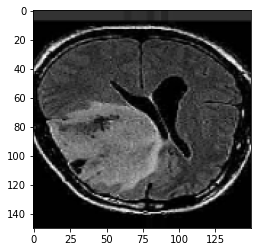

Brain Tumor


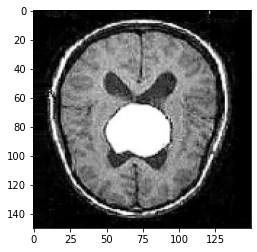

Brain Tumor


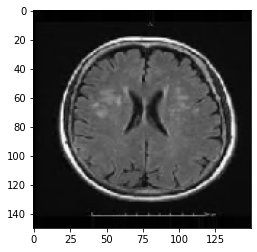

Healthy


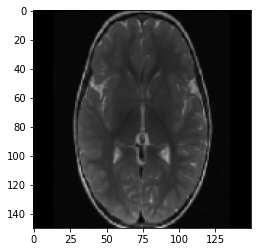

Healthy


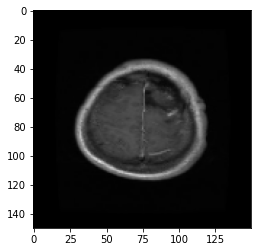

Brain Tumor


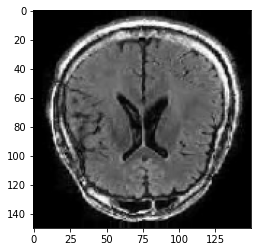

Healthy


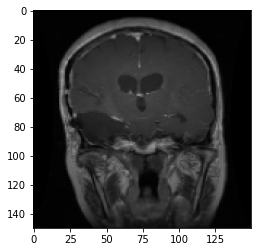

Brain Tumor


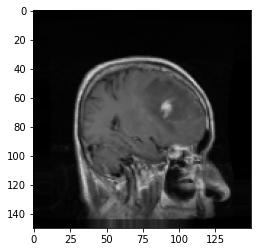

Brain Tumor


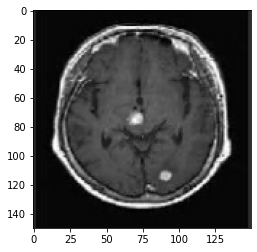

Healthy


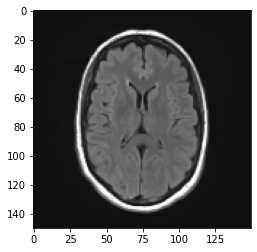

Healthy


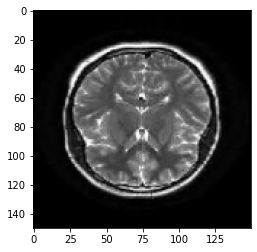

Healthy


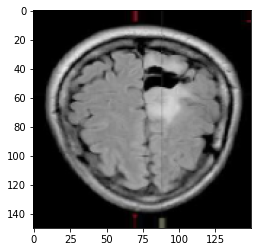

Brain Tumor


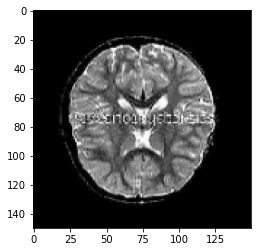

Healthy


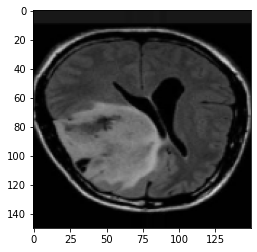

Brain Tumor


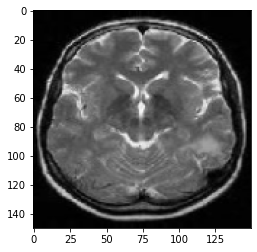

Healthy


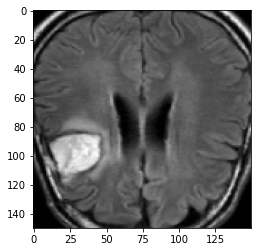

Brain Tumor


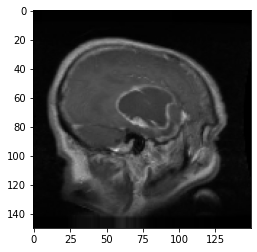

Brain Tumor


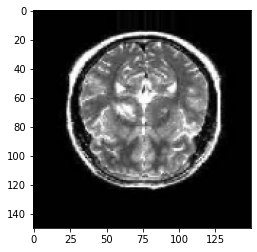

Healthy


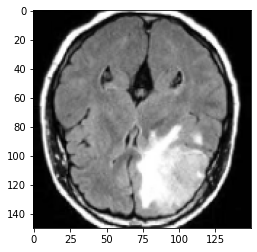

Brain Tumor


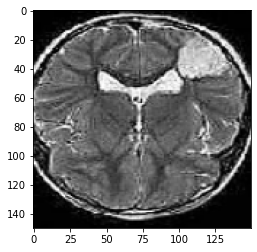

Brain Tumor


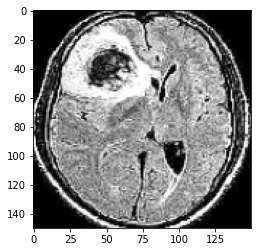

Brain Tumor


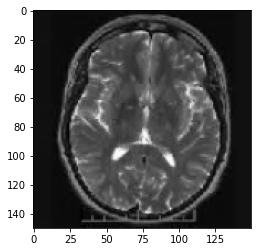

Healthy


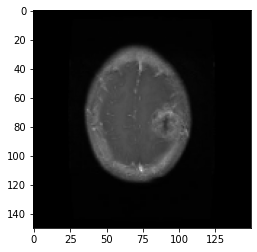

Brain Tumor


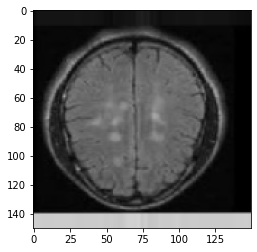

Healthy


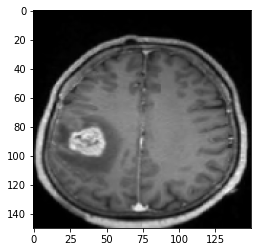

Brain Tumor


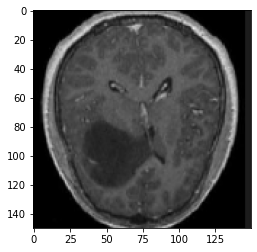

Brain Tumor


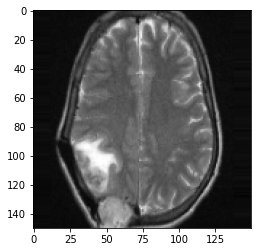

Brain Tumor


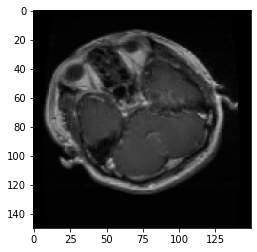

Brain Tumor


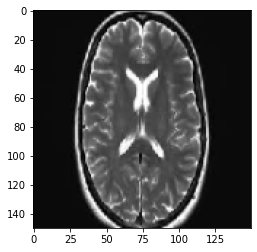

Healthy


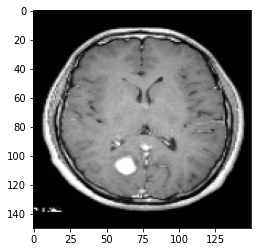

Brain Tumor


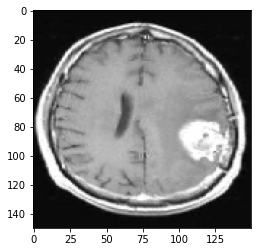

Brain Tumor


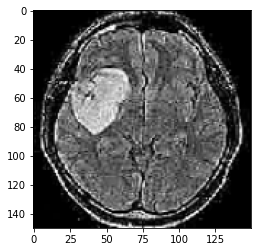

Brain Tumor


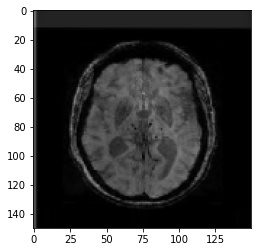

Healthy


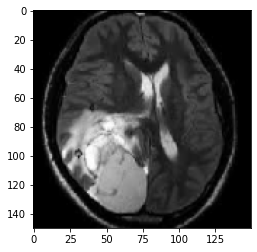

Brain Tumor


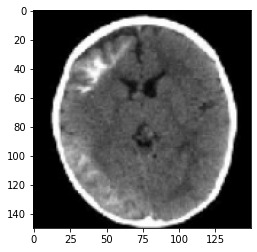

Healthy


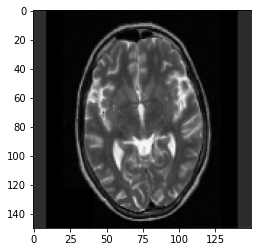

Healthy


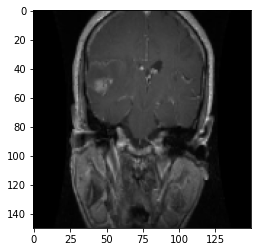

Brain Tumor


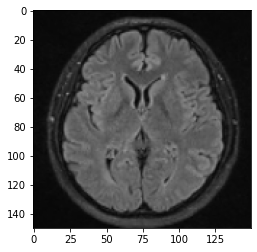

Healthy


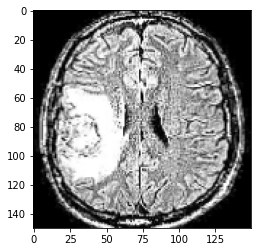

Brain Tumor


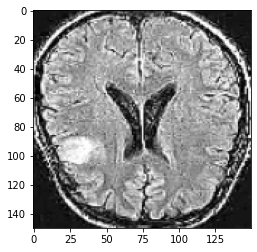

Brain Tumor


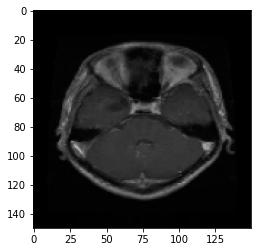

Brain Tumor


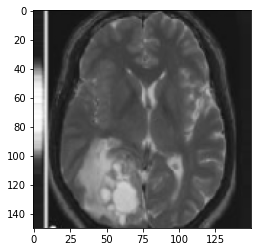

Brain Tumor


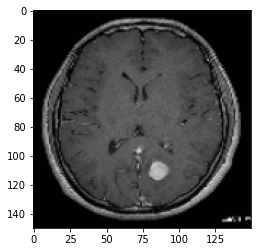

Brain Tumor


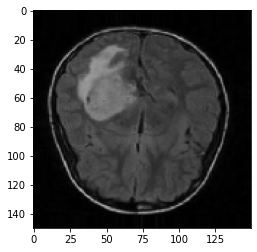

Brain Tumor


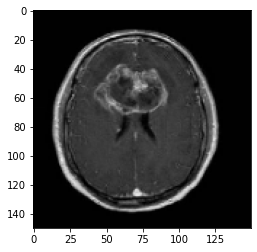

Brain Tumor


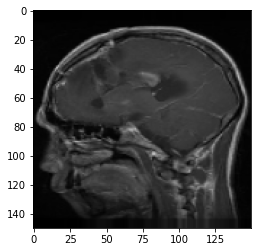

Brain Tumor


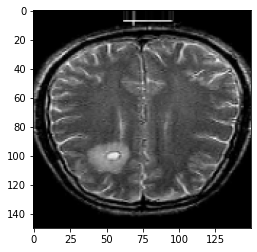

Brain Tumor


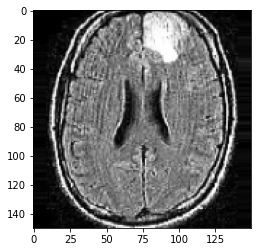

Brain Tumor


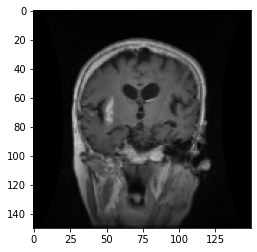

Brain Tumor


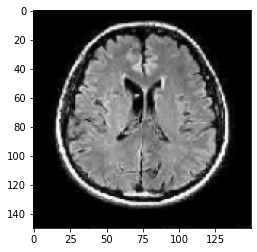

Healthy


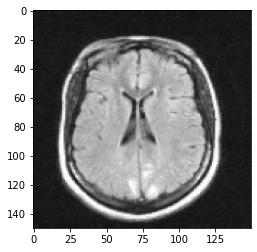

Healthy


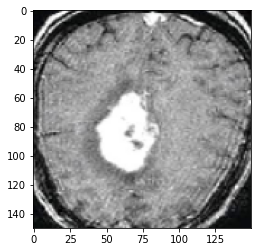

Brain Tumor


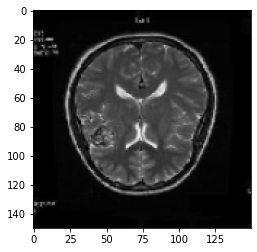

Healthy


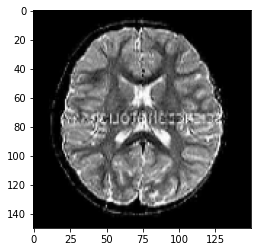

Healthy


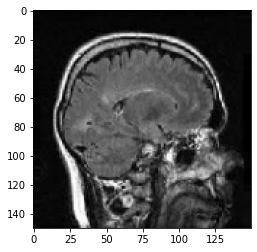

Healthy


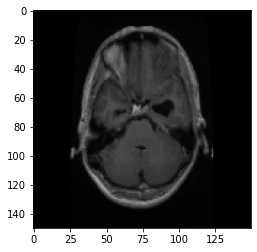

Brain Tumor


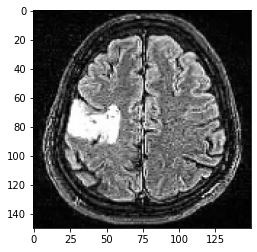

Brain Tumor


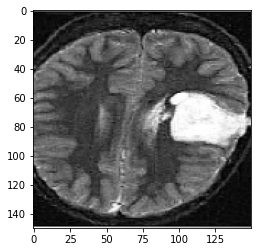

Brain Tumor


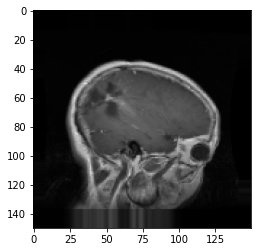

Brain Tumor


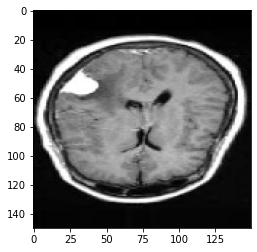

Brain Tumor


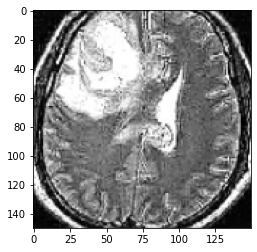

Brain Tumor


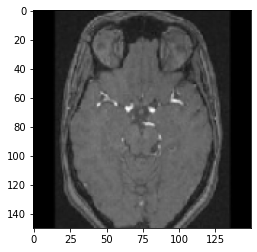

Healthy


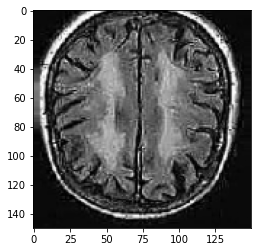

Healthy


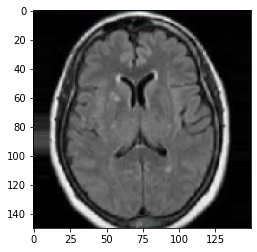

Healthy


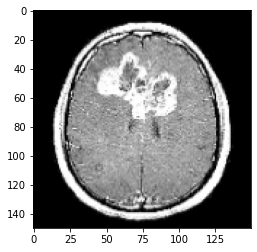

Brain Tumor


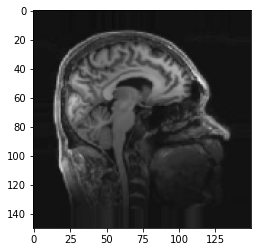

Healthy


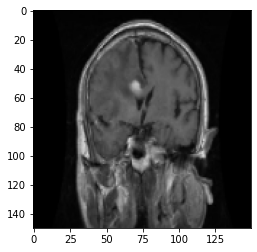

Brain Tumor


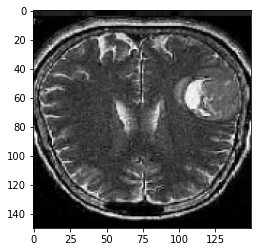

Brain Tumor


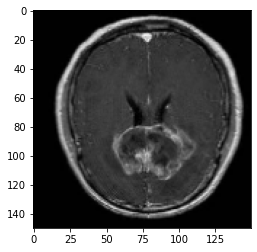

Brain Tumor


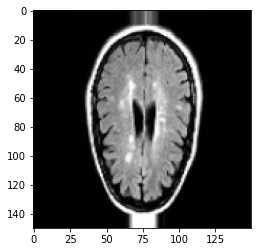

Healthy


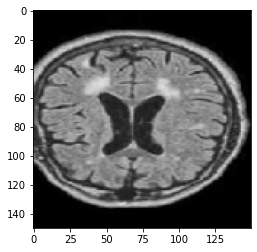

Healthy


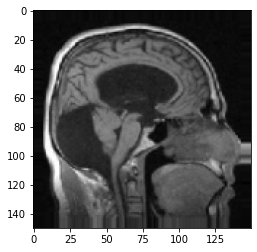

Healthy


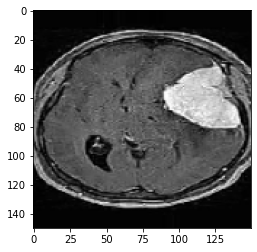

Brain Tumor


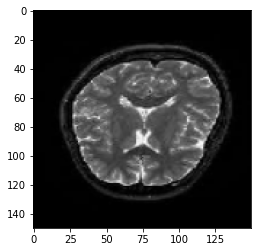

Healthy


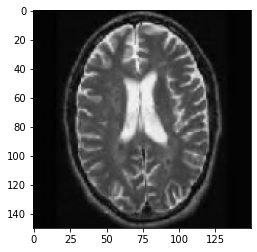

Healthy


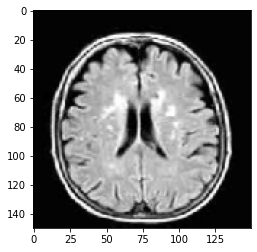

Healthy


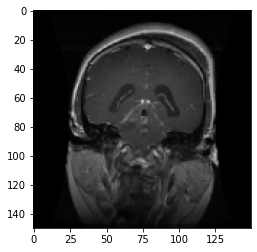

Brain Tumor


In [66]:
c = ['Brain Tumor', 'Healthy']
# Viewing the images in a batch 
for batch in train_generator:
    images = batch[0]
    labels = batch[1] # 0 = healthy 1 = Brain_Tumor
    for i in range(len(labels)):
        #displays an image and its label
        plt.imshow(images[i])
        plt.show()
        idx = labels[i]
        print(c[int(idx)])
    break # for a single batch of 256 images

# 4. Model

Originally based vgg16 model 
(https://towardsdatascience.com/step-by-step-vgg16-implementation-in-keras-for-beginners-a833c686ae6c)

Made 3 different models until had (and settled on) the best one with 90% train accuracy

In [77]:
# Make model wide and deep enough that they work well, 
# but no wider and deeper.
model = Sequential()

# input shape is 150 x 150 x 3
# adapted model to impliment batch normalizaiton
model.add(Conv2D(input_shape=(150,150,3),filters=32,kernel_size=(3,3),padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

model.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))

model.add(Flatten())

model.add(Dense(units=128,activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(rate=0.2))
model.add(Dense(units=128,activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(rate=0.2))
model.add(Dense(units=64,activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(rate=0.2))

model.add(Dense(units=1, activation="sigmoid"))

opt = Adam(learning_rate=0.001)

# changed loss from categorical_crossentropy to binary_crossentropy)
# since its a binary problem 
model.compile(optimizer=opt, loss=keras.losses.binary_crossentropy, metrics=['accuracy'])

model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 150, 150, 32)      896       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 75, 75, 32)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 75, 75, 64)        18496     
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 37, 37, 64)        0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 87616)             0         
_________________________________________________________________
dense_16 (Dense)             (None, 128)               11214976  
_________________________________________________________________
batch_normalization_12 (Batc (None, 128)              

In [78]:
earlystopping = callbacks.EarlyStopping(monitor="val_loss", mode="min", 
                                        patience=8, restore_best_weights = True)

# 5. Training

In [79]:
hist = model.fit(train_generator, callbacks = [earlystopping], validation_data = validation_generator,
                           epochs=30)

Epoch 1/30
15/15 [==============================] - 46s 3s/step - loss: 0.7572 - accuracy: 0.6137 - val_loss: 1.4224 - val_accuracy: 0.5391
Epoch 2/30
15/15 [==============================] - 44s 3s/step - loss: 0.6161 - accuracy: 0.6746 - val_loss: 0.7836 - val_accuracy: 0.5957
Epoch 3/30
15/15 [==============================] - 44s 3s/step - loss: 0.5389 - accuracy: 0.7426 - val_loss: 0.5481 - val_accuracy: 0.7000
Epoch 4/30
15/15 [==============================] - 62s 4s/step - loss: 0.4527 - accuracy: 0.7922 - val_loss: 0.4485 - val_accuracy: 0.8406
Epoch 5/30
15/15 [==============================] - 71s 5s/step - loss: 0.3839 - accuracy: 0.8295 - val_loss: 0.4546 - val_accuracy: 0.7623
Epoch 6/30
15/15 [==============================] - 77s 5s/step - loss: 0.3398 - accuracy: 0.8498 - val_loss: 0.4630 - val_accuracy: 0.7565
Epoch 7/30
15/15 [==============================] - 84s 6s/step - loss: 0.3596 - accuracy: 0.8436 - val_loss: 0.3429 - val_accuracy: 0.8594
Epoch 8/30
15/15 [==

In [95]:
print(model.evaluate(train_generator))
print(model.evaluate(validation_generator))

15/15 [==============================] - 109s 7s/step - loss: 0.1349 - accuracy: 0.9478
[0.13493555784225464, 0.9478119015693665]
3/3 [==============================] - 10s 2s/step - loss: 0.2686 - accuracy: 0.8957
[0.26861247420310974, 0.895652174949646]


# 6. Analysis & Conclusion

## Evaluate the model
https://www.tensorflow.org/tutorials/images/cnn

 **Model Predictions**

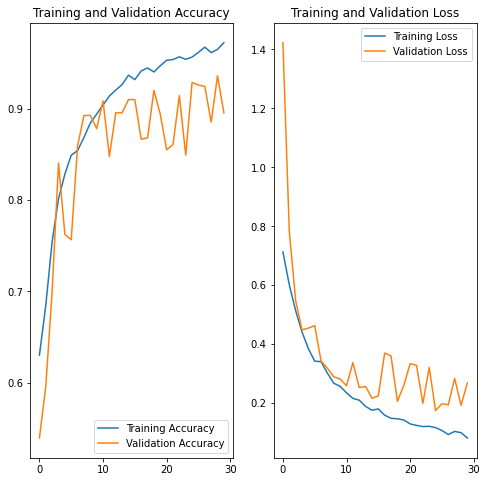

In [93]:
early_stop_epoch = 30

acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']

loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs_range = range(early_stop_epoch)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [82]:
test_loss, test_acc = model.evaluate(test_generator, verbose = 1)

1/1 [==============================] - 1s 1s/step - loss: 0.2019 - accuracy: 0.9481


In [83]:
print("Test Accuracy")
print(test_acc)
print("\nTest Loss")
print(test_loss)

Test Accuracy
0.948051929473877

Test Loss
0.20191209018230438


CNN has achieved a test accuracy of over 90%.

In [89]:
y_pred = (model.predict_classes(test_generator))

conf_mat = confusion_matrix(test_generator.classes, y_pred)

/home/nickknapton/miniconda3/envs/bmen415/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


In [90]:
print(conf_mat)

TP = conf_mat[1, 1]
TN = conf_mat[0, 0]
FP = conf_mat[0, 1]
FN = conf_mat[1, 0]

print (TP, TN, FP, FN)

[[125   1]
 [ 11  94]]
94 125 1 11


In [91]:
from sklearn import metrics
# use float to perform true division, not integer division
print((TP + TN) / float(TP + TN + FP + FN))
print(metrics.accuracy_score(test_generator.classes, y_pred))

0.948051948051948
0.948051948051948


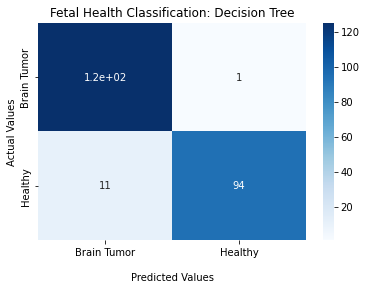

In [92]:
import seaborn as sb
from sklearn.metrics import classification_report, confusion_matrix

confusion = sb.heatmap(conf_mat, annot=True, cmap='Blues')
confusion.set_title("Fetal Health Classification: Decision Tree")
confusion.set_xlabel("\nPredicted Values")
confusion.set_ylabel("Actual Values")
confusion.xaxis.set_ticklabels(['Brain Tumor', 'Healthy'])
confusion.yaxis.set_ticklabels(['Brain Tumor', 'Healthy'])

plt.show()